In [1]:
import glob 
import os
import datetime

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.graph_objects as go
import plotly.express as px
%matplotlib inline

import pyspark
from pyspark import SparkContext

import pykafka as pk, pyspark as ps
from pykafka.exceptions import SocketDisconnectedError, LeaderNotAvailable
from pykafka import KafkaClient

import warnings
warnings.filterwarnings("ignore")

In [2]:
fpath = 'C:/Users/ykhan/Downloads/bpl/weather-data/'
files = os.listdir(fpath)
df1 = []
for f in files:
    df1.append(pd.read_csv(fpath + f, index_col=None, parse_dates=['YYYYMMDD'], header=0, sep='\s*,\s*'))
df = pd.DataFrame(pd.concat(df1, axis=0)    )


In [3]:
df = df.fillna(method='ffill')
df.head()
print(df.columns.tolist())

['STN', 'YYYYMMDD', 'TG', 'TN', 'TX', 'SQ', 'SP', 'DR', 'RH', 'RHX']


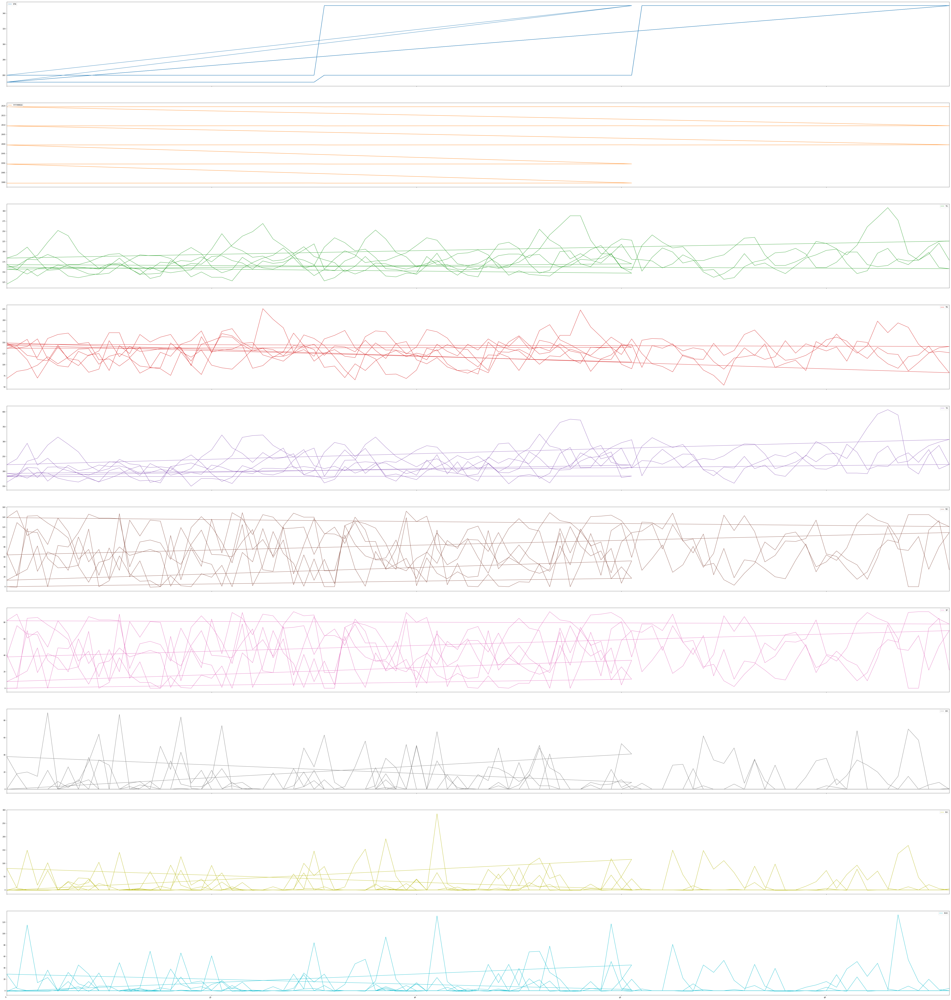

In [4]:
df.plot(subplots=True, figsize=(100,120))
plt.show()

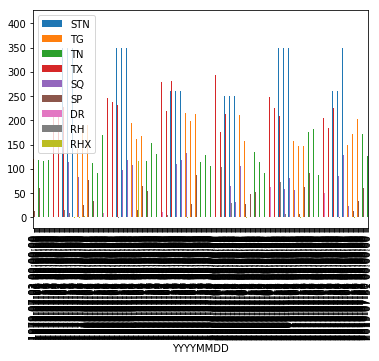

In [5]:
df.plot(x="YYYYMMDD", y=['STN', 'TG', 'TN', 'TX', 'SQ', 'SP', 'DR', 'RH', 'RHX'], kind="bar")
plt.savefig('barchart1.png')
plt.show()

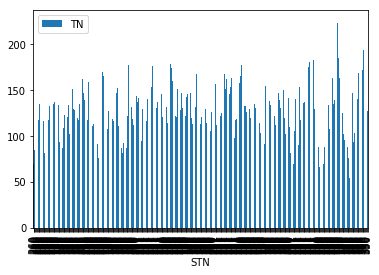

In [6]:
df.plot(x="STN", y=['TN'], kind="bar")
plt.savefig('barchart1.png')
plt.show()

In [7]:
df.shape

(403, 10)

In [8]:
df.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9,
            ...
            83, 84, 85, 86, 87, 88, 89, 90, 91, 92],
           dtype='int64', length=403)

In [9]:
df.columns

Index(['STN', 'YYYYMMDD', 'TG', 'TN', 'TX', 'SQ', 'SP', 'DR', 'RH', 'RHX'], dtype='object')

In [10]:
df260 = df.loc[df['STN'] == 260]
df350 = df.loc[df['STN'] == 350]
df251 = df.loc[df['STN'] == 251]

In [11]:
print ( df260.shape, df350.shape, df251.shape)

(155, 10) (155, 10) (93, 10)


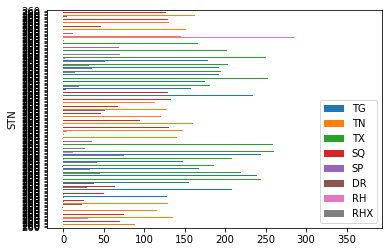

In [12]:
df260.plot(x="STN", y=['TG', 'TN', 'TX', 'SQ', 'SP', 'DR', 'RH', 'RHX'], kind="barh")
plt.savefig('barchartdf260.png')
plt.show()

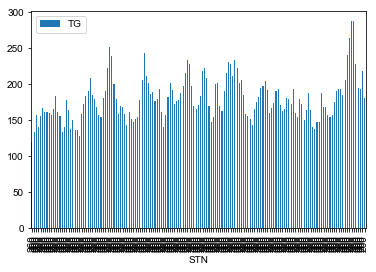

In [13]:
df260.plot(x="STN", y=['TG'], kind="bar")
plt.style.use('seaborn-whitegrid')
plt.savefig("TG.jpg", dpi=1225)
plt.show()

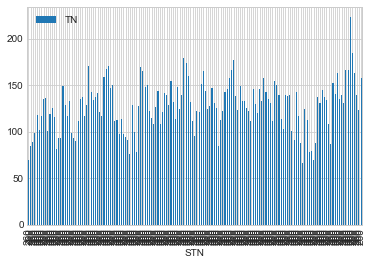

In [14]:
df260.plot(x="STN", y=['TN'], kind="bar")
plt.style.use('seaborn-whitegrid')
plt.savefig("TN.jpg", dpi=1225)
plt.show()

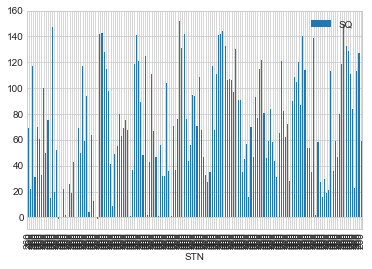

In [15]:
df260.plot(x="STN", y=['SQ'], kind="bar")
plt.style.use('seaborn-whitegrid')
plt.savefig("SQ.jpg", dpi=1225)
plt.show()

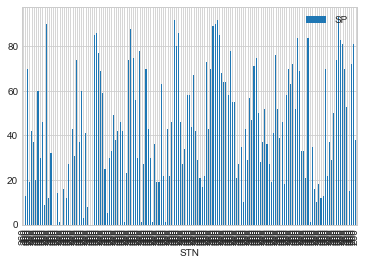

In [16]:
df260.plot(x="STN", y=['SP'], kind="bar")
plt.style.use('seaborn-whitegrid')
plt.savefig("SP.jpg", dpi=1225)
plt.show()

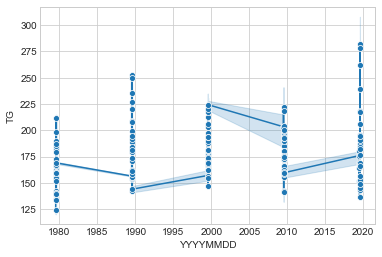

In [17]:
#s#ns.jointplot(x=df["YYYYMMDD"], y=df["TG"], kind='scatter', s=200, color='m', edgecolor="skyblue", linewidth=2)
sns.lineplot(x='YYYYMMDD', y='TG', data=df, marker='o')
# Custom the color
sns.set(style="white", color_codes=True)
#sns.jointplot(x=df["YYYYMMDD"], y=df["TG"], kind='kde', color="skyblue")
plt.show()

In [18]:
df.tail()

,STN,YYYYMMDD,TG,TN,TX,SQ,SP,DR,RH,RHX
88,350,2019-07-27,195,184,214,0,0,70,167,54
89,350,2019-07-28,179,146,191,0,0,57,47,16
90,350,2019-07-29,194,127,256,114,73,0,0,0
91,350,2019-07-30,221,130,287,133,85,0,0,0
92,350,2019-07-31,179,127,223,34,22,1,4,4


In [42]:
df251_1979_mask = (df251['YYYYMMDD'] >= '1979-07-01') & (df251['YYYYMMDD'] <= '1979-07-31')
df251_1979 = df251.loc[df251_1979_mask]
df251_1989_mask = (df251['YYYYMMDD'] >= '1989-07-01') & (df251['YYYYMMDD'] <= '1989-07-31')
df251_1989 = df251.loc[df251_1989_mask]
df251_1999_mask = (df251['YYYYMMDD'] >= '1999-07-01') & (df251['YYYYMMDD'] <= '1999-07-31')
df251_1999 = df251.loc[df251_1999_mask]
df251_2009_mask = (df251['YYYYMMDD'] >= '2009-07-01') & (df251['YYYYMMDD'] <= '2009-07-31')
df251_2009 = df251.loc[df251_2009_mask]
df251_2019_mask = (df251['YYYYMMDD'] >= '2019-07-01') & (df251['YYYYMMDD'] <= '2019-07-31')
df251_2019 = df251.loc[df251_2019_mask]

df260_1979_mask = (df260['YYYYMMDD'] >= '1979-07-01') & (df260['YYYYMMDD'] <= '1979-07-31')
df260_1979 = df260.loc[df260_1979_mask]
df260_1989_mask = (df260['YYYYMMDD'] >= '1989-07-01') & (df260['YYYYMMDD'] <= '1989-07-31')
df260_1989 = df260.loc[df260_1989_mask]
df260_1999_mask = (df260['YYYYMMDD'] >= '1999-07-01') & (df260['YYYYMMDD'] <= '1999-07-31')
df260_1999 = df260.loc[df260_1999_mask]
df260_2009_mask = (df260['YYYYMMDD'] >= '2009-07-01') & (df260['YYYYMMDD'] <= '2009-07-31')
df260_2009 = df260.loc[df260_2009_mask]
df260_2019_mask = (df260['YYYYMMDD'] >= '2019-07-01') & (df260['YYYYMMDD'] <= '2019-07-31')
df260_2019 = df260.loc[df260_2019_mask]

df350_1979_mask = (df350['YYYYMMDD'] >= '1979-07-01') & (df350['YYYYMMDD'] <= '1979-07-31')
df350_1979 = df350.loc[df350_1979_mask]
df350_1989_mask = (df350['YYYYMMDD'] >= '1989-07-01') & (df350['YYYYMMDD'] <= '1989-07-31')
df350_1989 = df350.loc[df350_1989_mask]
df350_1999_mask = (df350['YYYYMMDD'] >= '1999-07-01') & (df350['YYYYMMDD'] <= '1999-07-31')
df350_1999 = df350.loc[df350_1999_mask]
df350_2009_mask = (df350['YYYYMMDD'] >= '2009-07-01') & (df350['YYYYMMDD'] <= '2009-07-31')
df350_2009 = df350.loc[df350_2009_mask]
df350_2019_mask = (df350['YYYYMMDD'] >= '2019-07-01') & (df350['YYYYMMDD'] <= '2019-07-31')
df350_2019 = df350.loc[df350_2019_mask]

refineddf = [ df251_1979, df251_1989, df251_1999, df251_2009, df251_2019, df260_1979, df260_1989, df260_1999, df260_2009, df260_2019, df350_1979, df350_1989, df350_1999, df350_2009, df350_2019]

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
0   251 1999-07-01  162  144  182   13   8   0   -1   -1
1   251 1999-07-02  165  137  190   24  14  18    9    6
2   251 1999-07-03  181  141  213   35  21  20  149  115
3   251 1999-07-04  180  158  211   82  49  15   18   14
4   251 1999-07-05  154  113  167    0   0  89  102   23
5   251 1999-07-06  156   98  194   83  49   0    0    0
6   251 1999-07-07  168   95  220   80  48   0    0    0
7   251 1999-07-08  168  130  202  109  65   0    0    0
8   251 1999-07-09  175  120  208  146  87   0    0    0
9   251 1999-07-10  185  131  221  138  83   0    0    0
10  251 1999-07-11  193  172  216  138  83   0    0    0
11  251 1999-07-12  195  172  218  137  82   0    0    0
12  251 1999-07-13  179  116  210   40  24   0   -1   -1
13  251 1999-07-14  164  140  192   90  54   5    2    2
14  251 1999-07-15  156   93  196   94  57   3    1    1
15  251 1999-07-16  174  128  206   88  53   0    0    0
1

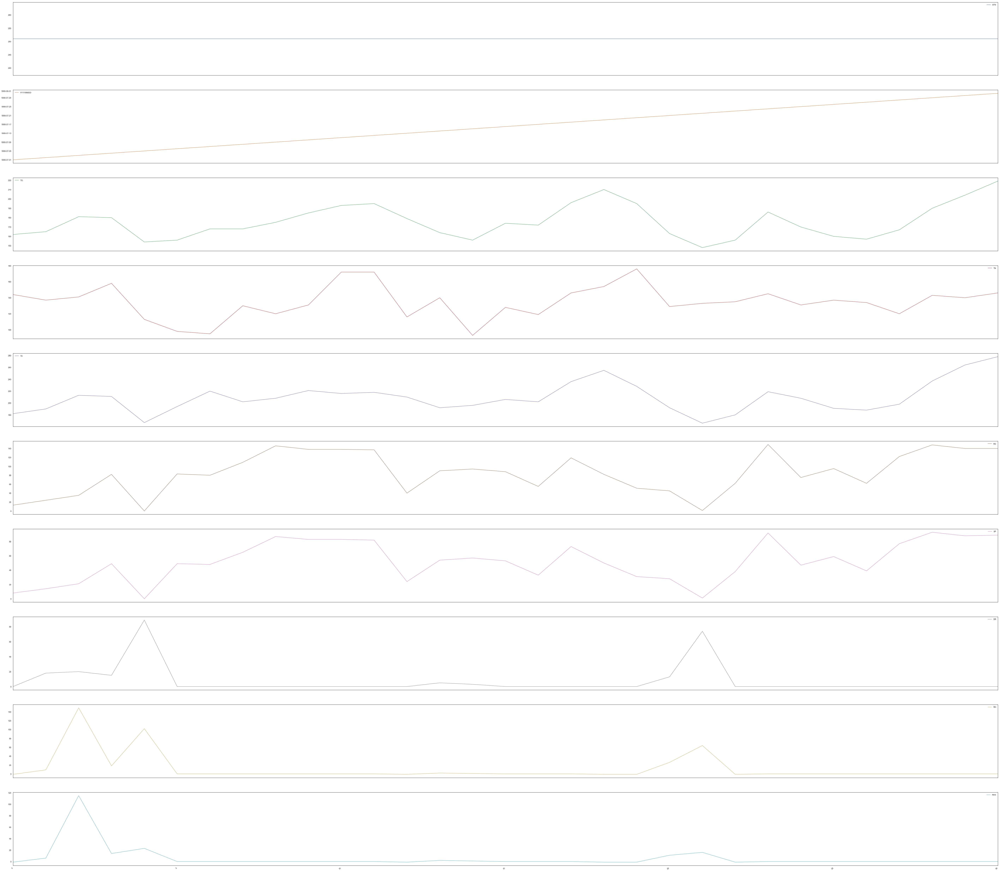

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
0   251 2009-07-01  184  146  222  139  82   0    0    0
1   251 2009-07-02  192  143  242  153  90   0    0    0
2   251 2009-07-03  211  157  294  103  61   0    0    0
3   251 2009-07-04  181  112  221  116  69   0    0    0
4   251 2009-07-05  193  109  244   85  50  22   73   36
5   251 2009-07-06  183  144  212  138  82   0   -1   -1
6   251 2009-07-07  165  112  202  111  66   6   32   32
7   251 2009-07-08  155   98  194   55  33   9   18   12
8   251 2009-07-09  145  122  176   75  45  32   28    6
9   251 2009-07-10  144  125  165   23  14  64  104   31
10  251 2009-07-11  147   87  176   78  47   0   -1   -1
11  251 2009-07-12  165  143  190   33  20  87  141   49
12  251 2009-07-13  179  125  207  134  81   0    0    0
13  251 2009-07-14  192  168  218  102  62   1    5    5
14  251 2009-07-15  190  151  213  134  81   9   69   69
15  251 2009-07-16  190  162  215  132  80   0    0    0
1

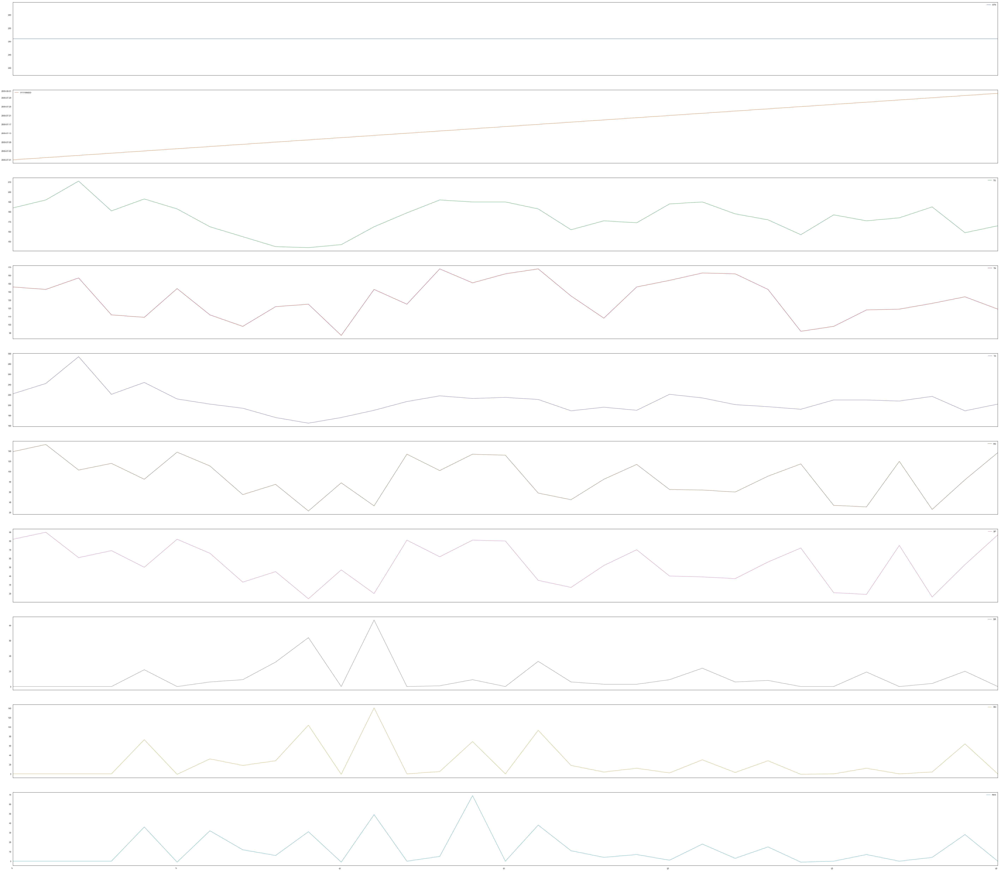

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
0   251 2019-07-01  168  149  193   64  38   0    0    0
1   251 2019-07-02  156  135  189  129  76   0   -1   -1
2   251 2019-07-03  145  111  177  111  66   0   -1   -1
3   251 2019-07-04  158   70  197  109  65   0   -1   -1
4   251 2019-07-05  161  106  194   57  34   0   -1   -1
5   251 2019-07-06  159  140  177   38  23   9    1    1
6   251 2019-07-07  140  114  169   39  23   2    3    3
7   251 2019-07-08  136  110  164   43  26  11   10    7
8   251 2019-07-09  141   83  179  116  69   0   -1   -1
9   251 2019-07-10  146   90  164    0   0  34   24    8
10  251 2019-07-11  168  154  202   12   7  28   14    8
11  251 2019-07-12  172  118  212   62  37   0   -1   -1
12  251 2019-07-13  158  141  182   26  16   7    2    2
13  251 2019-07-14  145  130  168   11   7   9    6    4
14  251 2019-07-15  145  132  170   12   7   0   -1   -1
15  251 2019-07-16  147  136  161    0   0   0    0    0
1

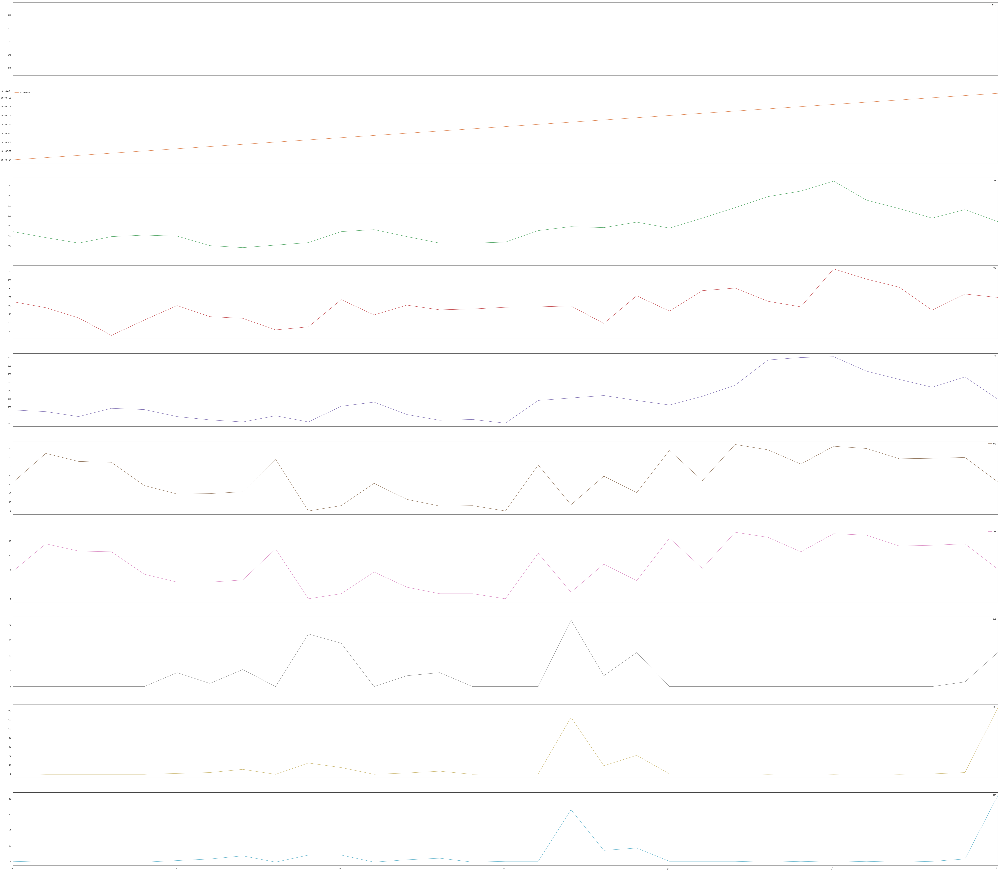

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR  RH  RHX
0   260 1979-07-01  120   69  163   69  41   0  -1   -1
1   260 1979-07-02  134   85  184   22  13   0   0    0
2   260 1979-07-03  157   89  210  117  70   0   0    0
3   260 1979-07-04  140   99  179   31  19   0   0    0
4   260 1979-07-05  156  118  214   70  42   0   0    0
5   260 1979-07-06  167  102  215   61  37   0   0    0
6   260 1979-07-07  162  117  212   33  20  26  30   16
7   260 1979-07-08  162  135  192  100  60   0  -1   -1
8   260 1979-07-09  160  136  187   50  30  37  40   16
9   260 1979-07-10  157  101  200   75  46   0   0    0
10  260 1979-07-11  165  119  209   15   9   0   0    0
11  260 1979-07-12  184  125  240  147  90   0   0    0
12  260 1979-07-13  161  116  225   20  12   3   3    3
13  260 1979-07-14  156   81  221   52  32   0   0    0
14  260 1979-07-15  134   93  163   -1   0   0  -1   -1
15  260 1979-07-16  140   93  170    0   0  50  14    5
16  260 1979-07-17

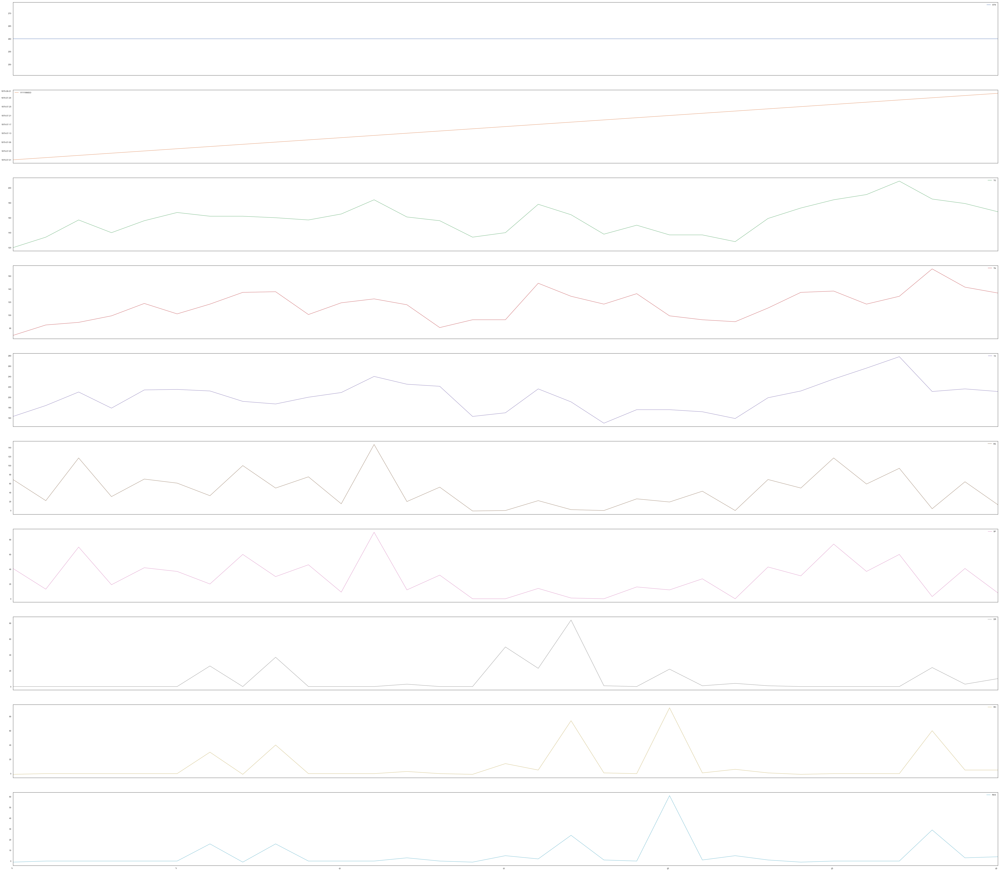

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
0   260 1989-07-01  157  137  185    0   0  38   81   29
1   260 1989-07-02  155  142  181   -1   0  17    7    4
2   260 1989-07-03  181  121  234  142  85   0    0    0
3   260 1989-07-04  191  117  244  143  86   0    0    0
4   260 1989-07-05  223  159  288  128  77   0    0    0
5   260 1989-07-06  252  168  315  115  69   0    0    0
6   260 1989-07-07  239  171  291   98  59   3    1    1
7   260 1989-07-08  200  147  265   41  25   7   45   45
8   260 1989-07-09  179  150  220    9   5  11   43   29
9   260 1989-07-10  159  111  201   49  30   0    0    0
10  260 1989-07-11  170  113  232   55  33   0    0    0
11  260 1989-07-12  168   97  229   80  49   0    0    0
12  260 1989-07-13  159  114  207   63  38   0   -1   -1
13  260 1989-07-14  143   97  186   69  42   0   -1   -1
14  260 1989-07-15  162   94  226   75  46   0   -1   -1
15  260 1989-07-16  152   91  210   68  42   0   -1   -1
1

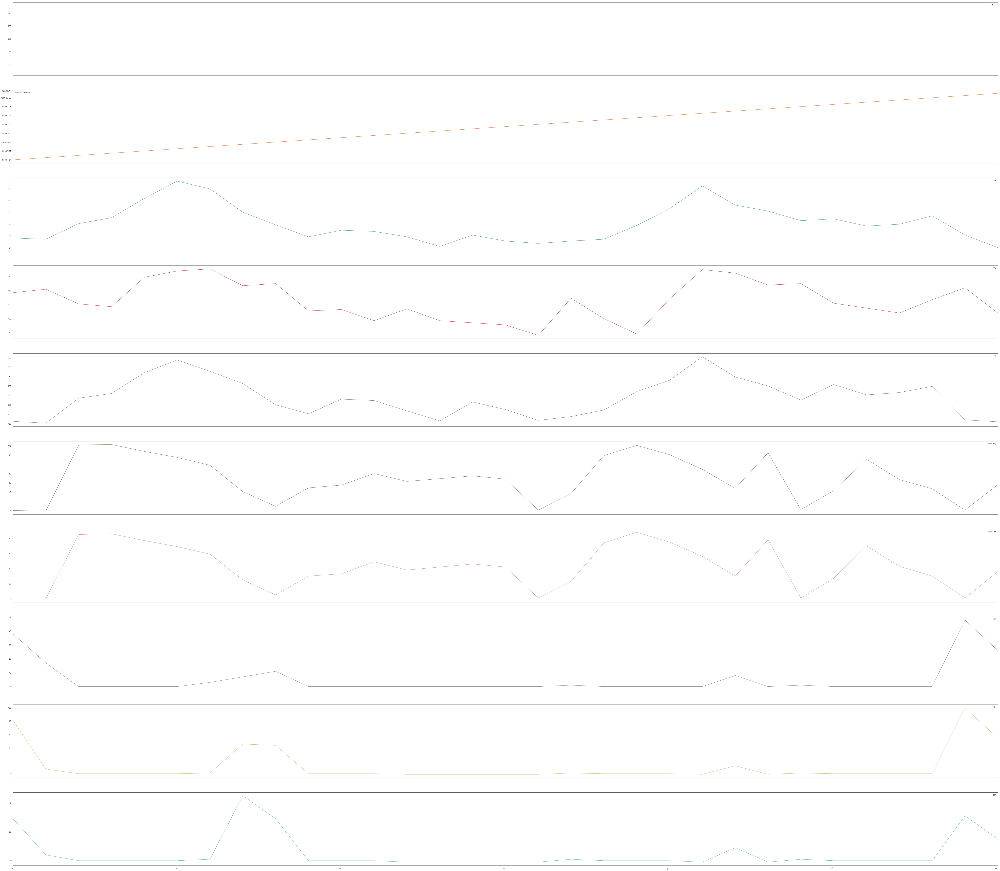

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
31  260 1999-07-01  157  121  183   32  19  11   12    9
32  260 1999-07-02  182  142  232   32  19   0   -1   -1
33  260 1999-07-03  202  140  272  104  63   3   11   11
34  260 1999-07-04  192  129  241   36  22  26   97   47
35  260 1999-07-05  173  155  193    1   1  56  153   55
36  260 1999-07-06  177  132  220   71  43   0    0    0
37  260 1999-07-07  178  114  234   37  22   2    5    5
38  260 1999-07-08  188  148  230   76  46   0    0    0
39  260 1999-07-09  197  124  249  152  92   0    0    0
40  260 1999-07-10  215  140  271  131  80   0    0    0
41  260 1999-07-11  234  179  286  142  86   0    0    0
42  260 1999-07-12  228  174  281   76  46   0    0    0
43  260 1999-07-13  198  160  244   44  27   0    0    0
44  260 1999-07-14  170  132  200   56  34  15   11    8
45  260 1999-07-15  165  111  210   95  58   0   -1   -1
46  260 1999-07-16  171   95  228   94  58   0    0    0
4

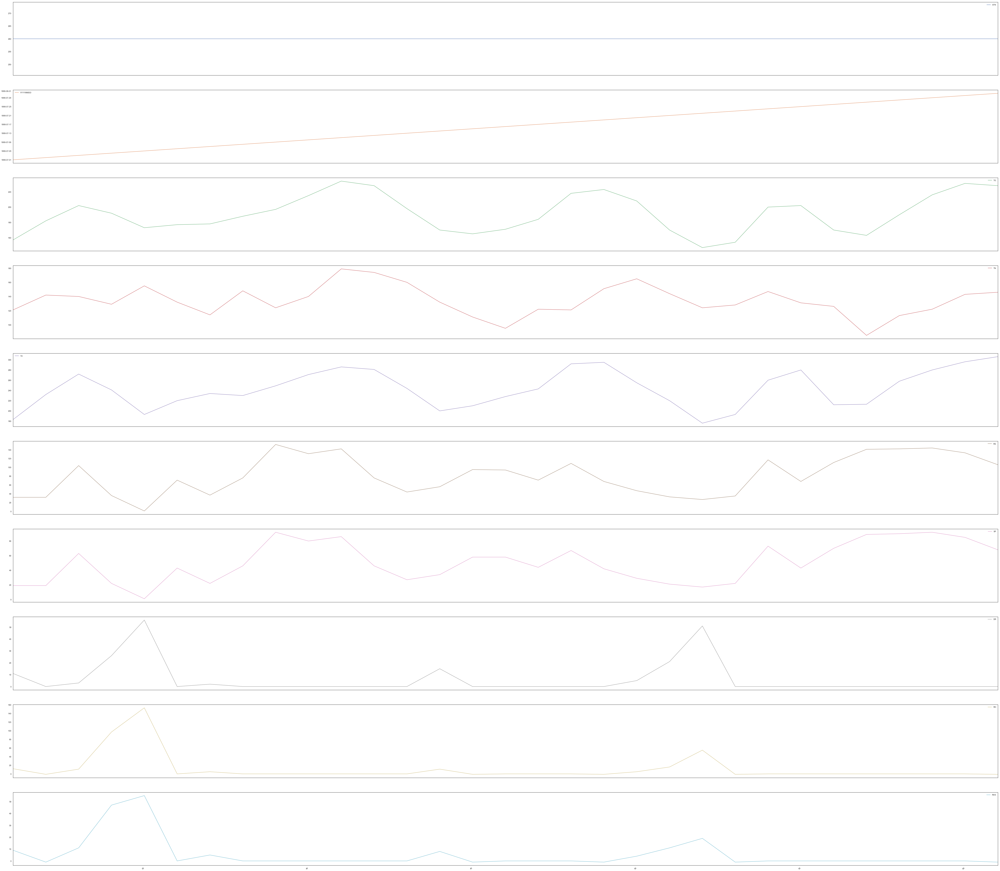

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
31  260 2009-07-01  211  158  264  107  64   0    0    0
32  260 2009-07-02  234  166  297  106  64   0    0    0
33  260 2009-07-03  222  177  289   97  58   0    0    0
34  260 2009-07-04  202  138  249  130  78   0    0    0
35  260 2009-07-05  206  123  277   91  55   0   -1   -1
36  260 2009-07-06  185  149  231   91  55   4   17   17
37  260 2009-07-07  158  133  185   35  21  36  192   94
38  260 2009-07-08  156  133  191   45  27  25   51   20
39  260 2009-07-09  151  126  181   57  35   0   -1   -1
40  260 2009-07-10  144  122  172   16  10  51   41   14
41  260 2009-07-11  166  111  202   70  43   0   -1   -1
42  260 2009-07-12  175  146  215   47  29  67   65   23
43  260 2009-07-13  182  130  231   93  57   0    0    0
44  260 2009-07-14  195  120  253   77  47   0   -1   -1
45  260 2009-07-15  197  146  239  115  71   1    3    3
46  260 2009-07-16  204  133  251  122  75   0    0    0
4

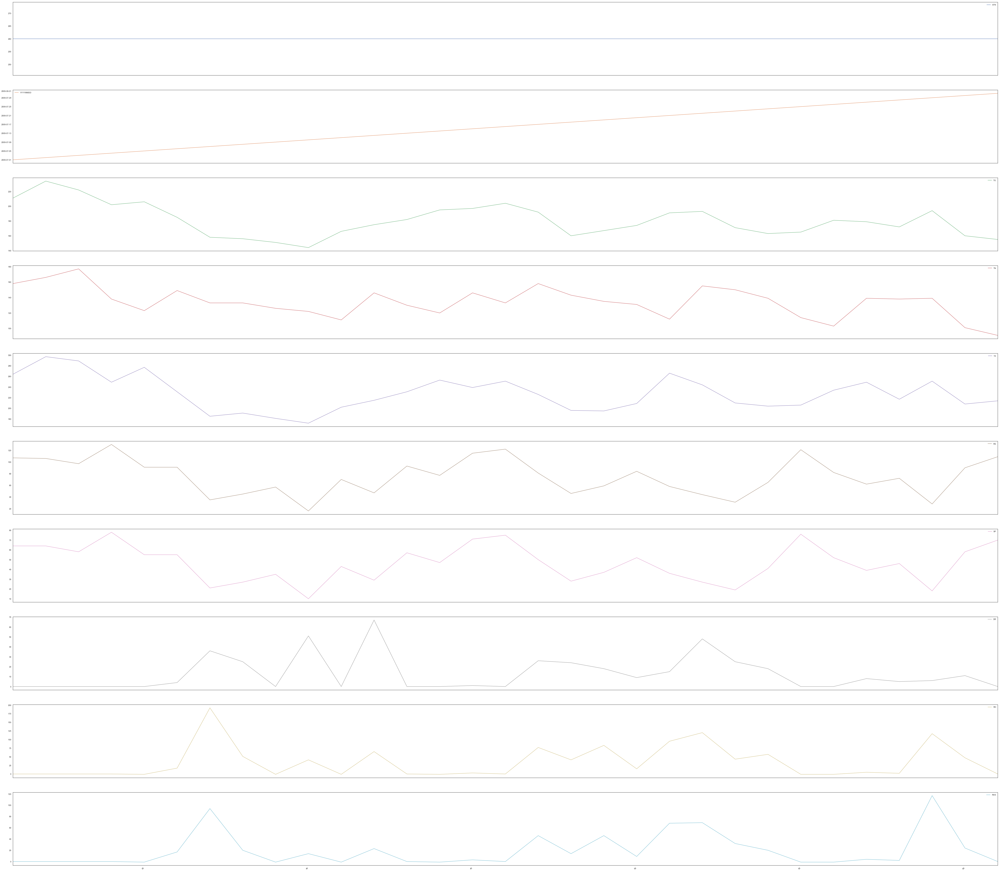

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
31  260 2019-07-01  180  143  209  105  63   0    0    0
32  260 2019-07-02  173  117  217  120  72   0    0    0
33  260 2019-07-03  150   88  202   87  52   0    0    0
34  260 2019-07-04  164   66  228  140  84   0    0    0
35  260 2019-07-05  188  124  232  114  69   0    0    0
36  260 2019-07-06  164  113  229   54  33  25   22   11
37  260 2019-07-07  140   78  181   54  33   0    0    0
38  260 2019-07-08  138   79  167   35  21   3    3    1
39  260 2019-07-09  147   69  204  139  84   0    0    0
40  260 2019-07-10  147   88  187    2   1  50   39   12
41  260 2019-07-11  188  137  238   58  35   0   -1   -1
42  260 2019-07-12  168  131  205   27  16  33  286  131
43  260 2019-07-13  168  145  197   16  10  13   23   16
44  260 2019-07-14  157  137  193   30  18   2    1    1
45  260 2019-07-15  155  134  185   19  12   0   -1   -1
46  260 2019-07-16  157  108  191   21  13   0    0    0
4

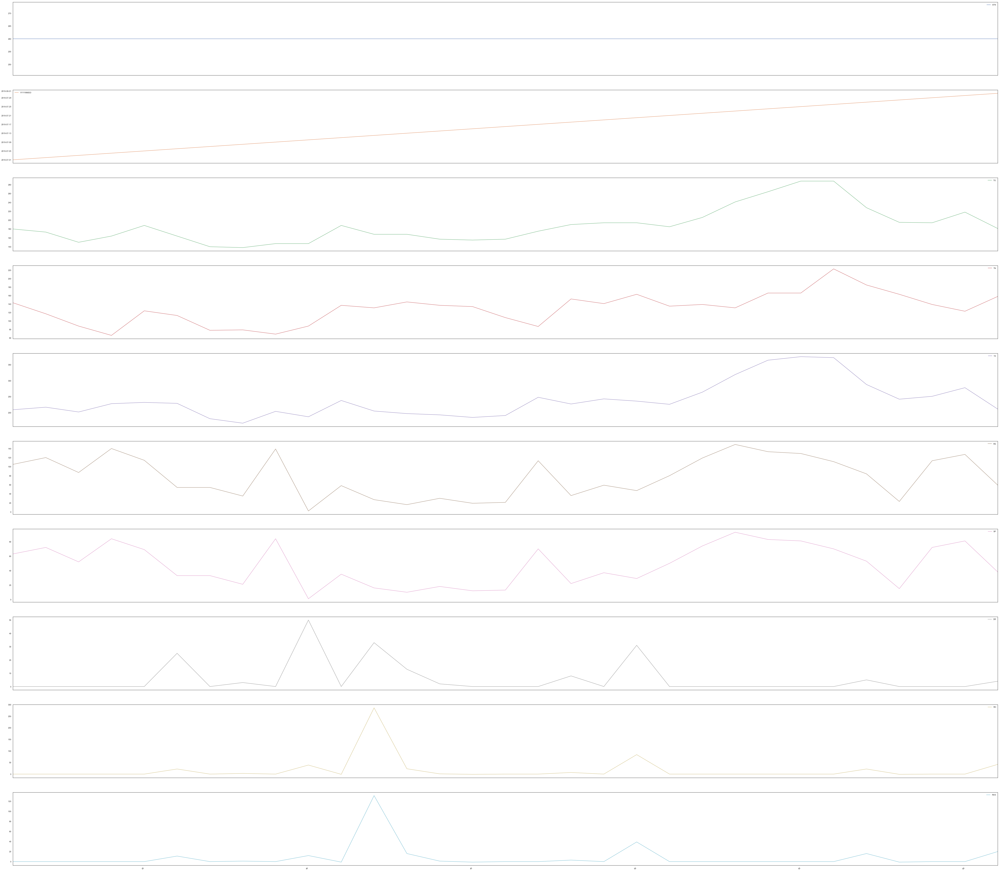

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR  RH  RHX
31  350 1979-07-01  128   94  161   55  33   0   0    0
32  350 1979-07-02  136   97  173    6   4   0  -1   -1
33  350 1979-07-03  155   71  216  123  74   0   0    0
34  350 1979-07-04  145  102  194   85  51   0   0    0
35  350 1979-07-05  154   87  206   62  38   0   0    0
36  350 1979-07-06  172  109  228   55  33   0   0    0
37  350 1979-07-07  170  123  228   58  35  18  15    7
38  350 1979-07-08  162  132  209   94  57   0   1    1
39  350 1979-07-09  157  118  192   40  24  52  24    9
40  350 1979-07-10  164  126  202   35  21   0   0    0
41  350 1979-07-11  167  121  211    9   6   0   0    0
42  350 1979-07-12  196  134  256  114  70   0   0    0
43  350 1979-07-13  158  102  191    4   2  17   8    6
44  350 1979-07-14  154   87  232   47  29   0  -1   -1
45  350 1979-07-15  142   88  182    1   1   0  -1   -1
46  350 1979-07-16  138   79  167    0   0  17   4    3
47  350 1979-07-17

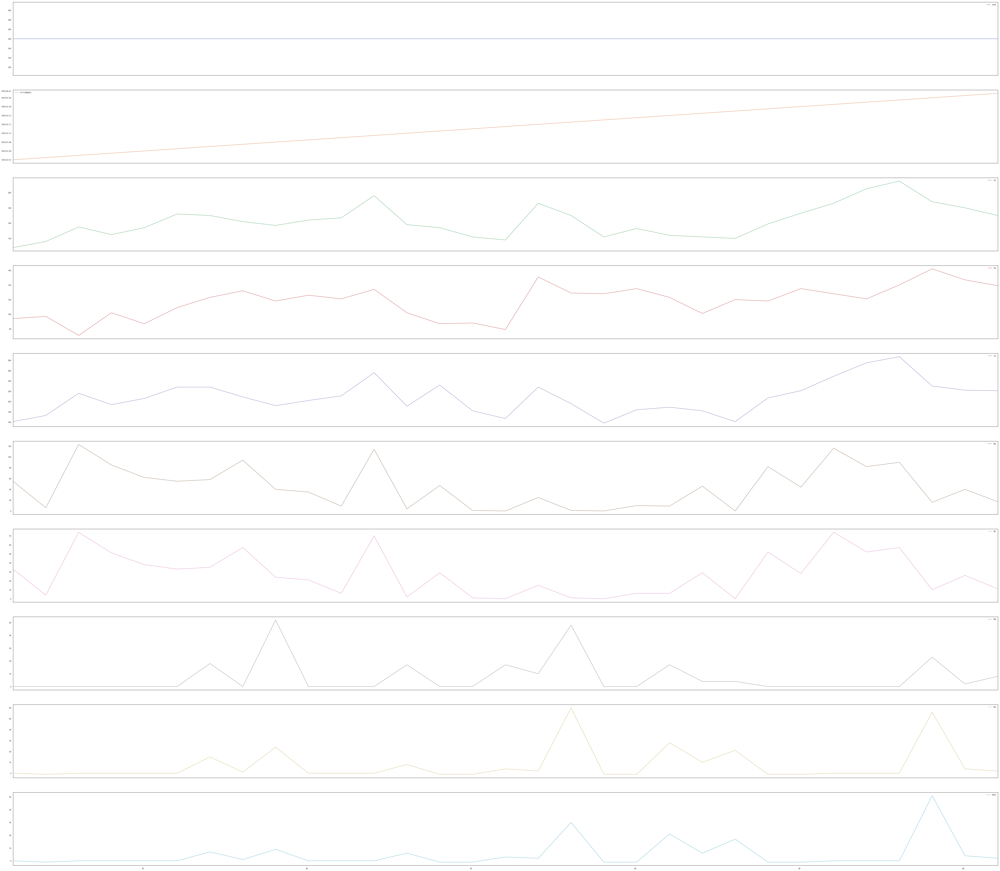

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
31  350 1989-07-01  156  126  176    0   0  63   88   29
32  350 1989-07-02  153  134  181    0   0   8    2    1
33  350 1989-07-03  177  119  237  123  74   0    0    0
34  350 1989-07-04  187  116  238  132  80   0    0    0
35  350 1989-07-05  231  163  290  127  77   0    0    0
36  350 1989-07-06  253  176  315  118  72   0    0    0
37  350 1989-07-07  231  174  281   87  53  11    5    3
38  350 1989-07-08  198  147  250   40  24   0   -1   -1
39  350 1989-07-09  187  152  232   32  20   0   -1   -1
40  350 1989-07-10  162  111  215   57  35   0   -1   -1
41  350 1989-07-11  171  102  234   69  42   0    0    0
42  350 1989-07-12  179  116  242  108  66   0    0    0
43  350 1989-07-13  157   95  222   83  51   0    0    0
44  350 1989-07-14  142   87  193   81  50   0   -1   -1
45  350 1989-07-15  162   81  233   97  60   0    0    0
46  350 1989-07-16  157   92  207   59  36   0    0    0
4

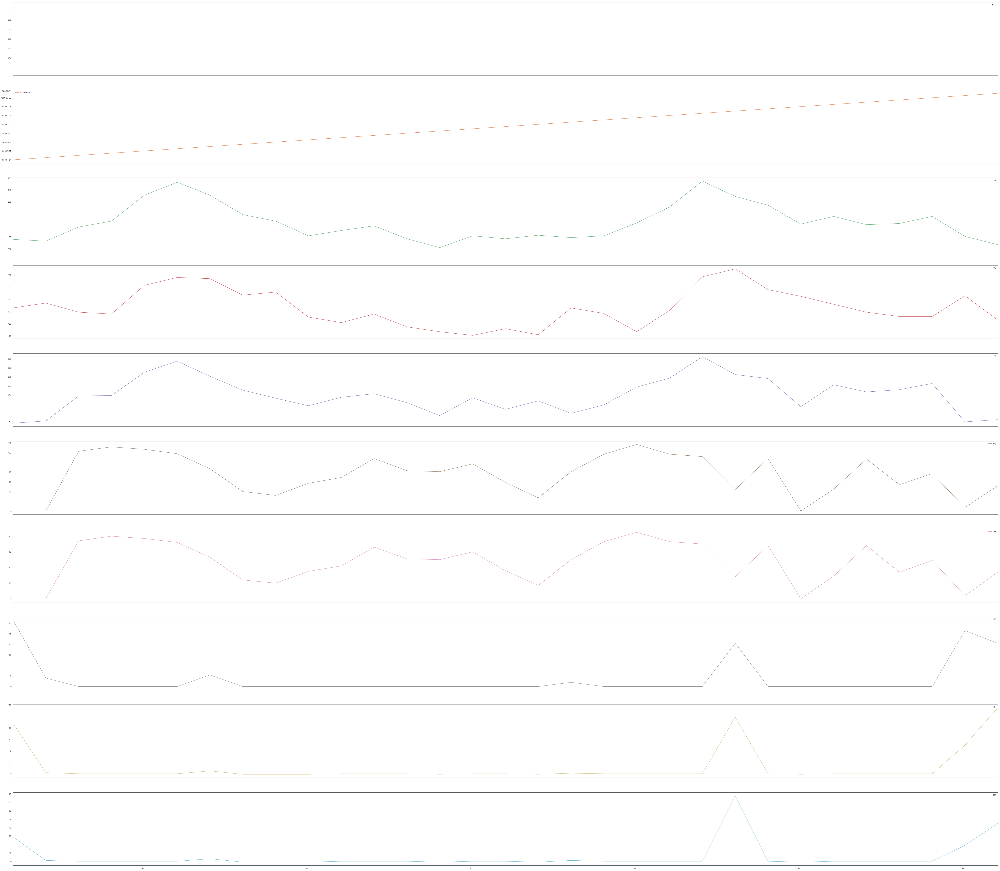

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
62  350 1999-07-01  152   94  185   33  20   7    4    3
63  350 1999-07-02  186  143  243   57  34   0    0    0
64  350 1999-07-03  209  137  274   84  51   0    0    0
65  350 1999-07-04  199  147  248   29  18  28  149   81
66  350 1999-07-05  172  120  211   44  27  29   57   22
67  350 1999-07-06  178  113  235   81  49   0    0    0
68  350 1999-07-07  178  112  243   39  24   4    2    2
69  350 1999-07-08  186  148  239   67  41   0    0    0
70  350 1999-07-09  192  121  252  144  88   0    0    0
71  350 1999-07-10  212  132  275  113  69   0    0    0
72  350 1999-07-11  233  168  292  143  87   0    0    0
73  350 1999-07-12  235  178  291  111  68   0    0    0
74  350 1999-07-13  192  153  258   50  31   0    0    0
75  350 1999-07-14  166  128  209   63  39  28   97   39
76  350 1999-07-15  166  110  219   92  57   0   -1   -1
77  350 1999-07-16  175  113  231   91  56   0   -1   -1
7

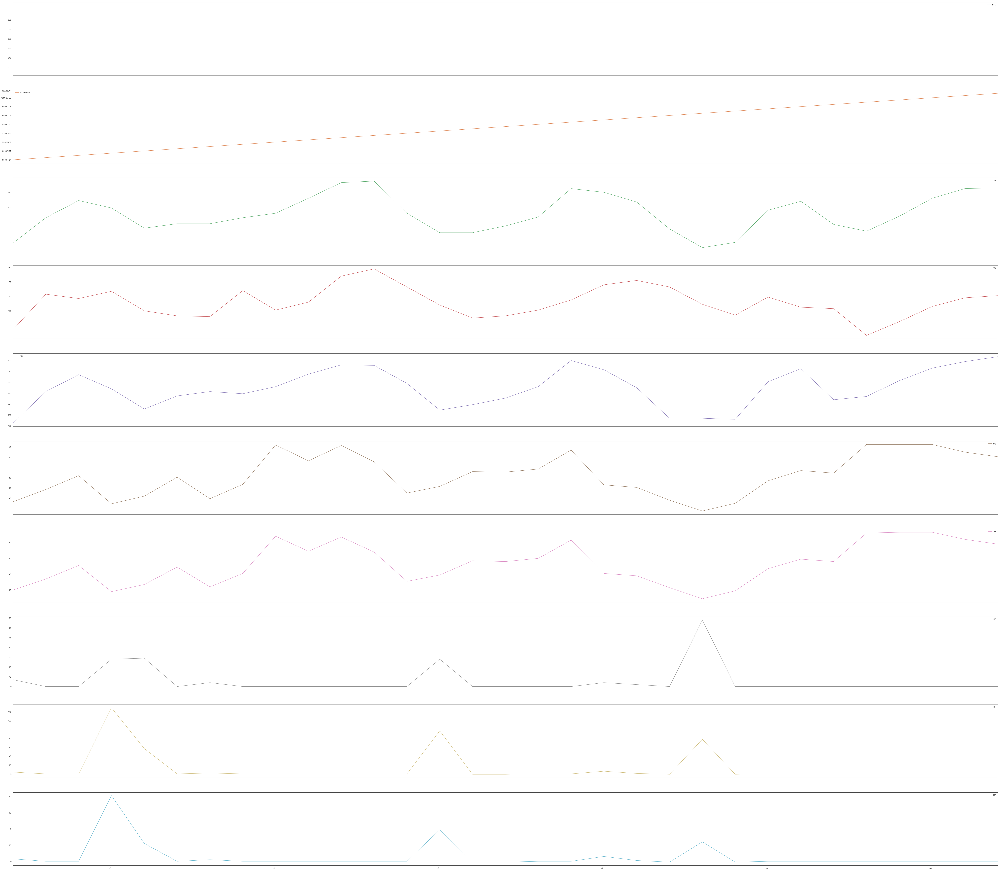

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
62  350 2009-07-01  215  155  284  112  68   0    0    0
63  350 2009-07-02  241  159  313  126  76   0    0    0
64  350 2009-07-03  223  158  296   76  46   0    0    0
65  350 2009-07-04  209  145  280  125  76   0    0    0
66  350 2009-07-05  212  131  290   92  56   0   -1   -1
67  350 2009-07-06  186  138  249   96  58   0   -1   -1
68  350 2009-07-07  154  134  206   42  26  62  148   45
69  350 2009-07-08  156  107  202   47  29  34   78   32
70  350 2009-07-09  132   90  176   14   9  30  110   53
71  350 2009-07-10  136  115  160    3   2  48   65   18
72  350 2009-07-11  163  118  210   27  17   7    7    4
73  350 2009-07-12  175  122  225   47  29  35   28    9
74  350 2009-07-13  180  112  239   90  55   0    0    0
75  350 2009-07-14  197  118  256   74  46   0   -1   -1
76  350 2009-07-15  199  154  249  106  65   0   -1   -1
77  350 2009-07-16  208  126  265  110  68   0    0    0
7

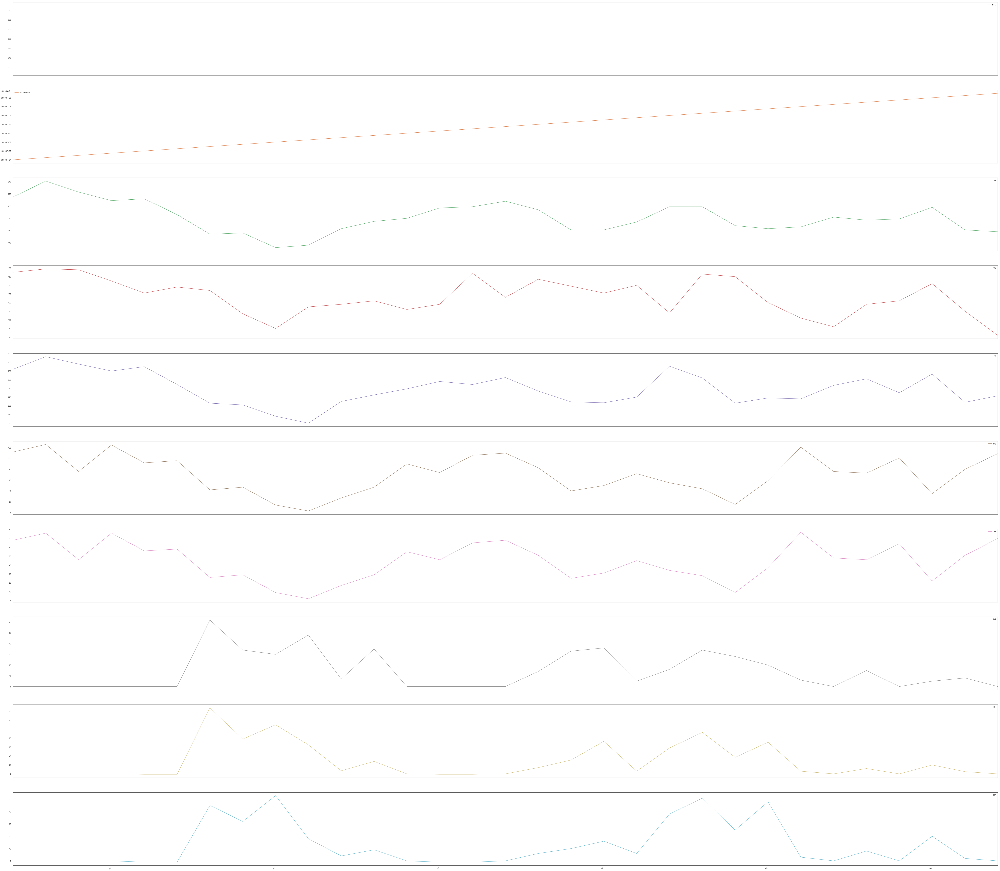

<bound method NDFrame.head of     STN   YYYYMMDD   TG   TN   TX   SQ  SP  DR   RH  RHX
62  350 2019-07-01  180  125  236  130  78   0    0    0
63  350 2019-07-02  177  102  234  129  78   0    0    0
64  350 2019-07-03  160   96  224  116  70   0    0    0
65  350 2019-07-04  170   84  240  148  90   0    0    0
66  350 2019-07-05  192  122  258   93  56   0    0    0
67  350 2019-07-06  180  115  257   68  41  24   16   12
68  350 2019-07-07  150   88  205  106  64   0    0    0
69  350 2019-07-08  137   76  185   24  15   0    0    0
70  350 2019-07-09  146   54  214   77  47   0    0    0
71  350 2019-07-10  162  109  211   18  11   6    2    2
72  350 2019-07-11  195  138  250   54  33   0    0    0
73  350 2019-07-12  166  121  209   51  31  34   89   46
74  350 2019-07-13  172  147  221   36  22  10   12    8
75  350 2019-07-14  157   94  189   20  12   0   -1   -1
76  350 2019-07-15  146  103  183   16  10   0   -1   -1
77  350 2019-07-16  165  110  219   53  33   0    0    0
7

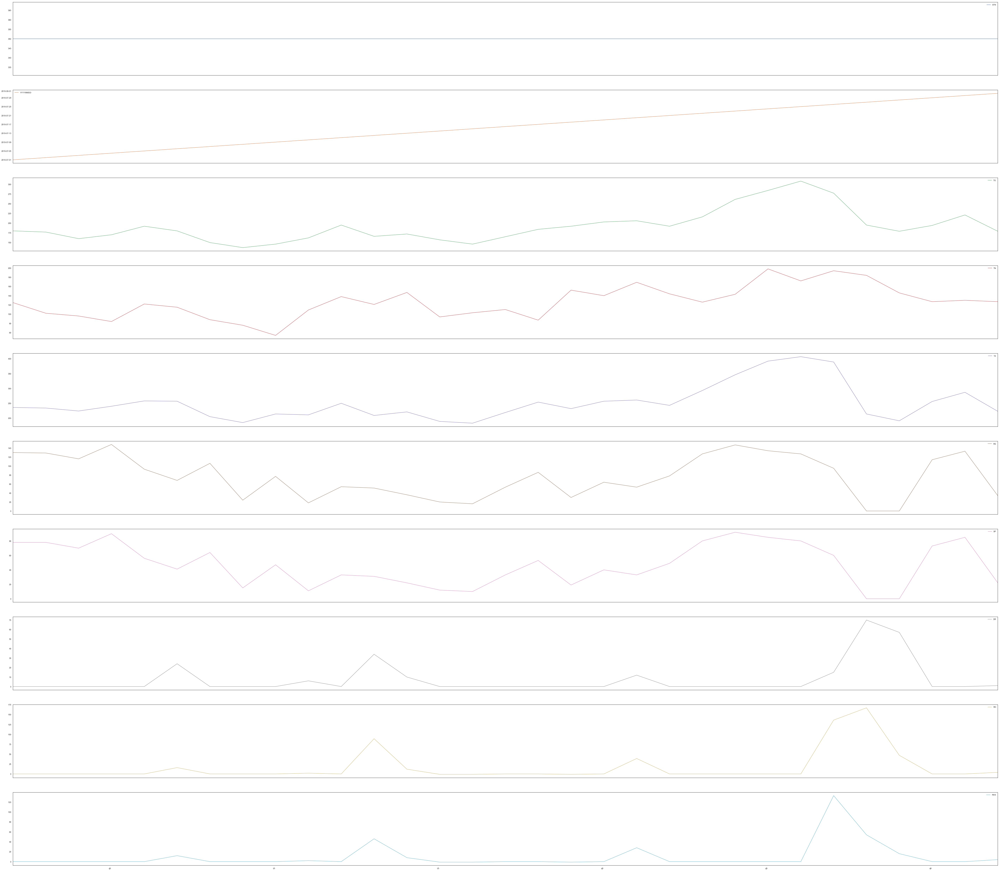

In [41]:
for ev in refineddf: 
    if not (ev.empty): 
        ev.plot(subplots=True, figsize=(100,100))
        plt.show()
    else:
        continue            